In [1]:
from pyspark import SparkConf, SparkContext

from pyspark.mllib.feature import Word2Vec

from sklearn.manifold import TSNE

from numpy.random import rand
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt

#sc = SparkContext('local[5]') #spark://172.26.5.43:7077

conf = (SparkConf()
         .setMaster("local[5]")
         .setAppName("My app")
         .set("spark.executor.memory", "3g")
         .set("spark.driver.memory", "3g")
         .set("spark.memory.fraction","0.5")
         .set("spark.memory.storageFraction","0.1")
       )

sc = SparkContext(conf = conf)

#analytics/pdml-html-tokenized
#/analytics/packets-html-langs
data = sc.textFile('hdfs://172.26.5.36/analytics/pdml-html-tokenized-eng-nonjs/',100)\
        .map(lambda doc:  doc.split(" "))
        
             
docs = sc.parallelize(data.take(100))
           
word2vec = Word2Vec().setVectorSize(1000).setSeed(42)
model = word2vec.fit(docs)
print("model is created...")
# Save and load model
#model.save(sc, "myModelPath")
#val sameModel = Word2VecModel.load(sc, "myModelPath")

model is created...


In [75]:
from pyspark import SparkConf, SparkContext
from pyspark.mllib.feature import Word2Vec

from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler

#n_samples = 100
X_list = []
word_list = []
word_synonims = {}
vector_synonums = {}
model_vectors =  model.getVectors() #word to vec
word_to_syn_map = {}

for word, vector in model_vectors.items():
    #print(word, " -> ", vector)
    word_list.append(word)
    X_list.append(vector)
   
    syns_vec = {}
    all_syns = []  
    for syn_word, cosine_distance in model.findSynonyms(word, 5):
        all_syns.append(syn_word)
        syns_vec[syn_word] = model_vectors.get(syn_word) #!!!!!
    word_synonims[word] = syns_vec
    word_to_syn_map[word] = all_syns
    

X_raw = np.array(X_list) #X_list[:n_samples]
print("transforming data to two dimensions...")

#modelTSNE = TSNE(n_components=2, random_state=0)
modelTSNE = TSNE(perplexity=30, n_components=2, init='pca', n_iter=5000)
np.set_printoptions(suppress=True)
X_2d = modelTSNE.fit_transform(X_raw) 


X_scaled = MinMaxScaler().fit_transform(X_2d)
wordmap = {}

#print("scaled  2d word to syns map...\n",syns_2d_scaled)
print("formatting data...")
for i in range(0, len(X_scaled)):
    x = X_scaled[i][0]
    y = X_scaled[i][1]
    key = word_list[i]
    wordmap[key] = {"x": x, "y": y}
    
print("formatting complete...")

transforming data to two dimensions...
formatting data...
formatting complete...


In [76]:
from pyspark.mllib.clustering import KMeans, KMeansModel
from numpy import array
from math import sqrt

# Build the model (cluster the data)
N = 100
dataVectrors = sc.parallelize(X_scaled)

kMeansModel = KMeans.train(dataVectrors, N, maxIterations=1000,\
                           runs=100, initializationMode="random")

vectors = dataVectrors.collect()
clusters = {}
for v in vectors:
    cluster_id = kMeansModel.predict(v)
    clusters.setdefault(cluster_id, []).append(v)
    
print(clusters.keys())
    
# Evaluate clustering by computing Within Set Sum of Squared Errors
def error(point):
    center = kMeansModel.centers[kMeansModel.predict(point)]
    return sqrt(sum([x**2 for x in (point - center)]))

WSSSE = dataVectrors.map(lambda point: error(point)).reduce(lambda x, y: x + y)
print("Within Set Sum of Squared Error = ", str(WSSSE))

# Save and load model
#clusters.save(sc, "myModelPath")
#sameModel = KMeansModel.load(sc, "myModelPath")

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])
Within Set Sum of Squared Error =  138.64789857860373


In [78]:
%matplotlib inline

import colorsys
HSV_tuples = [(x*1.0/N, 0.5, 0.5) for x in range(N)]
#print(HSV_tuples)

RGB_tuples = list(map(lambda x: colorsys.hsv_to_rgb(*x), HSV_tuples))

print("colors are ready for", N, "clusters")
#print(HSV_tuples)

colors are ready for 100 clusters


In [72]:
%matplotlib inline

import matplotlib
import numpy as np
import matplotlib.pyplot as plt


labels = []
x = []
y = []

for word, vector in wordmap.items():
    #print(word, "->" ,vector)
    labels.append(word)
    x.append(vector.get('x'))
    y.append(vector.get('y'))

plt.figure(figsize=(150, 150))  #in inches

for clusterId, clusterVectors in clusters.items():
    clusterColor =  RGB_tuples[clusterId]
    #print("drow cluster #",clusterId, "with color", clusterColor)
   
    c_x = []
    c_y = []  
    for vec in clusterVectors:
        c_x.append(vec[0])
        c_y.append(vec[1])
        
    plt.scatter(c_x,c_y,c=clusterColor, s=150, edgecolor='none')
    
print("total number of points to draw :", len(wordmap))

for i, label in enumerate(labels):
    #plt.plot(x[i], y[i], 'ro')
    plt.annotate(label,
                 xy=(x[i], y[i]),
                 xytext=(3, 5),
                 textcoords='offset points',
                 ha='left',
                 va='bottom')
    
plt.show()

total number of points to draw : 5152


/opt/conda/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


/opt/conda/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


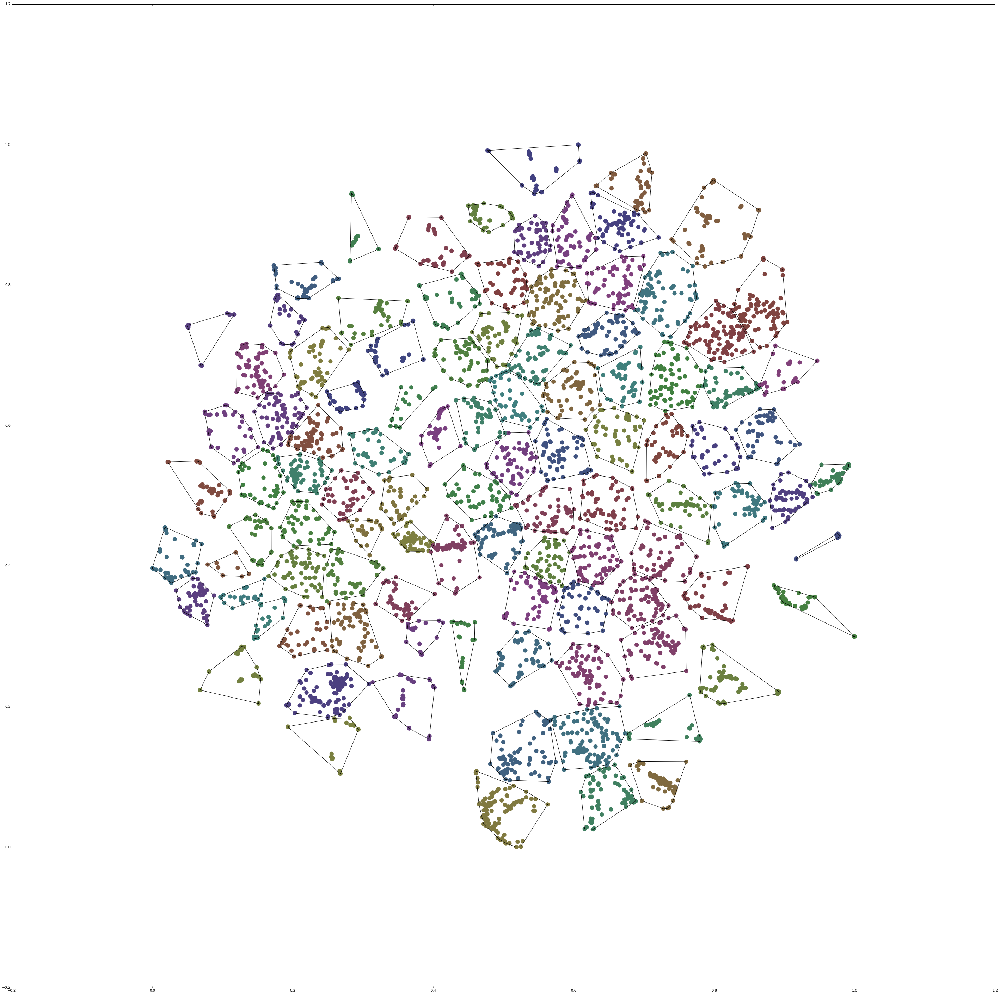

In [80]:
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt


plt.figure(figsize=(50, 50))  #in inches


for clusterId, clusterVectors in clusters.items():
    clusterColor =  RGB_tuples[clusterId]
    points = []
    for vec in clusterVectors:
        points.append([vec[0],vec[1]])
     
    points = np.array(points)
    #print(points)
        
    #print("drow cluster #",clusterId, "with color", clusterColor) 
    hull = ConvexHull(points)
    #plt.plot(points[:,0], points[:,1], 'o')
    plt.scatter(points[:,0],points[:,1],c=clusterColor, s=150, edgecolor='none')
    for simplex in hull.simplices:
        plt.plot(points[simplex, 0], points[simplex, 1], 'k-') #
        

    
#hull_points = cv.vertices
# the vertices of the convex hull

#set(range(len(pointList))).difference(ch.vertices)
# the vertices inside the convex hull

In [82]:
%matplotlib inline

import matplotlib
import numpy as np
import matplotlib.pyplot as plt


labels = []
x = []
y = []

for word, vector in wordmap.items():
    #print(word, "->" ,vector)
    labels.append(word)
    x.append(vector.get('x'))
    y.append(vector.get('y'))

from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt


plt.figure(figsize=(150, 150))  #in inches


for clusterId, clusterVectors in clusters.items():
    clusterColor =  RGB_tuples[clusterId]
    points = []
    for vec in clusterVectors:
        points.append([vec[0],vec[1]])
     
    points = np.array(points)
    #print(points)
        
    #print("drow cluster #",clusterId, "with color", clusterColor) 
    hull = ConvexHull(points)
    #plt.plot(points[:,0], points[:,1], 'o')
    plt.scatter(points[:,0],points[:,1],c=clusterColor, s=150, edgecolor='none')
    for simplex in hull.simplices:
        plt.plot(points[simplex, 0], points[simplex, 1], 'k-') #
        

        
        
for i, label in enumerate(labels):
    #plt.plot(x[i], y[i], 'ro')
    plt.annotate(label,
                 xy=(x[i], y[i]),
                 xytext=(3, 5),
                 textcoords='offset points',
                 ha='left',
                 va='bottom')
    
#hull_points = cv.vertices
# the vertices of the convex hull

#set(range(len(pointList))).difference(ch.vertices)
# the vertices inside the convex hull


/opt/conda/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


In [77]:
w = 'december'

s =  model.findSynonyms(w, 5)

print("word: ", w)
print("(synonim","| similarity rate [0..1])")
print()
for word, cs in s:
    print(word, " : ", cs)


word:  december
(synonim | similarity rate [0..1])

january  :  1.0740713897
sunday  :  1.0733876036
arrives  :  0.967681301576
october  :  0.957454475549
extravaganza  :  0.957385045649
